<a href="https://colab.research.google.com/github/MisaOgura/flashtorch/blob/master/examples/create_saliency_maps_for_torchvision_models_colab.ipynb" target="_parent">
    <img src="https://colab.research.google.com/assets/colab-badge.svg"/>
</a>

## Using `flashtorch.saliency.backprop` with `torchvision.models`
---

Demo of creating saliency maps for a wide range of models available from `torchvision.models`.

It assumes that you are familiar with how to use `flashtorch.saliency.backprop` to create saliency maps. For step-by-step instructions on how to create saliency maps, head to [**this one**](https://github.com/MisaOgura/flashtorch/blob/master/examples/visualize_saliency_with_backprop.ipynb) instead.

from https://github.com/MisaOgura/flashtorch run under pyFlashTorch

### 0. Set up

In [2]:
# Install flashtorch if you don't have it

!pip install flashtorch

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Preparing metadata (setup.py) ... done
  Created wheel for flashtorch: filename=flashtorch-0.1.3-py3-none-any.whl size=26247 sha256=2830756ce8a34a209be013d9255318b66e911a27f1ed7fc5b2d1d23a360021a2
  Stored in directory: /root/.cache/pip/wheels/62/7a/fd/e186c4584835bf57e3b56f8470c018af80c0ac1f5723b4262a
Successfully built flashtorch


In [13]:
!pip install torch==1.5.0

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 752.0/752.0 MB 2.0 MB/s eta 0:00:00
  Attempting uninstall: torch
    Found existing installation: torch 1.13.1+cu116
    Uninstalling torch-1.13.1+cu116:
      Successfully uninstalled torch-1.13.1+cu116
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchvision 0.14.1+cu116 requires torch==1.13.1, but you have torch 1.5.0 which is incompatible.
torchtext 0.14.1 requires torch==1.13.1, but you have torch 1.5.0 which is incompatible.
torchaudio 0.13.1+cu116 requires torch==1.13.1, but you have torch 1.5.0 which is incompatible.
fastai 2.7.10 requires torch<1.14,>=1.7, but you have torch 1.5.0 which is incompatible.


In [14]:
!pip install torchvision==0.6.0

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.6/6.6 MB 47.5 MB/s eta 0:00:00
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.14.1+cu116
    Uninstalling torchvision-0.14.1+cu116:
      Successfully uninstalled torchvision-0.14.1+cu116
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
fastai 2.7.10 requires torch<1.14,>=1.7, but you have torch 1.5.0 which is incompatible.
fastai 2.7.10 requires torchvision>=0.8.2, but you have torchvision 0.6.0 which is incompatible.


In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import matplotlib.pyplot as plt
import torchvision.models as models

from flashtorch.utils import apply_transforms, load_image
from flashtorch.saliency import Backprop

### 1. Load an image 

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
cd /content/drive/MyDrive/teaching/CS827/my practicals/

/content/drive/MyDrive/teaching/CS827/my practicals


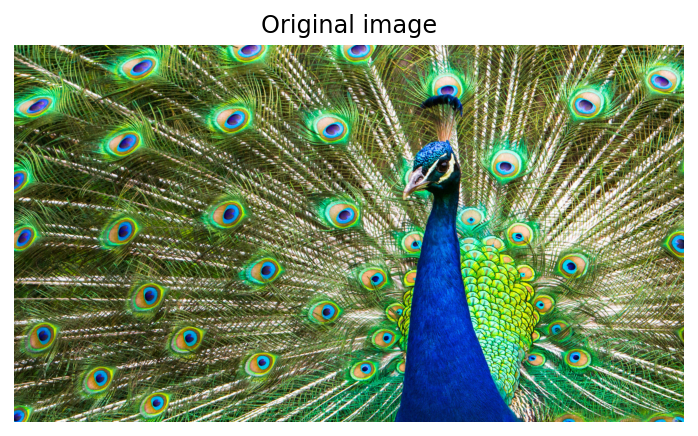

In [4]:
image = load_image('./images/peacock.jpg')

plt.imshow(image)
plt.title('Original image')
plt.axis('off');

# Prepare inputs to be used later

img = apply_transforms(image)

### 2. Use pre-trained models from `torchvision.models`

In [5]:
# A wrapper to help out visualization

def visualize_helper(model_module, tensor=img, k=84):
    model = model_module(pretrained=True)
    backprop = Backprop(model)
    backprop.visualize(tensor, k, guided=True)

#### AlexNet

Downloading: "https://download.pytorch.org/models/alexnet-owt-4df8aa71.pth" to /root/.cache/torch/checkpoints/alexnet-owt-4df8aa71.pth


  0%|          | 0.00/233M [00:00<?, ?B/s]

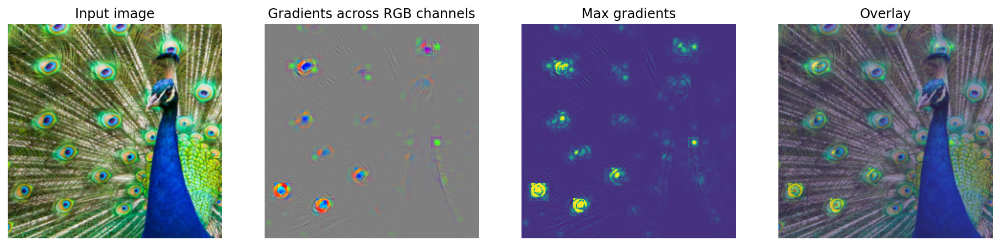

In [6]:
visualize_helper(models.alexnet)

#### VGG-19

Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/checkpoints/vgg19-dcbb9e9d.pth


  0%|          | 0.00/548M [00:00<?, ?B/s]

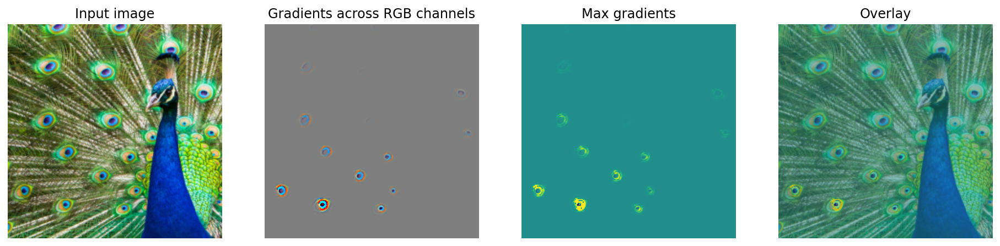

In [7]:
visualize_helper(models.vgg19)

#### VGG-19 with batch normalization

Downloading: "https://download.pytorch.org/models/vgg19_bn-c79401a0.pth" to /root/.cache/torch/checkpoints/vgg19_bn-c79401a0.pth


  0%|          | 0.00/548M [00:00<?, ?B/s]

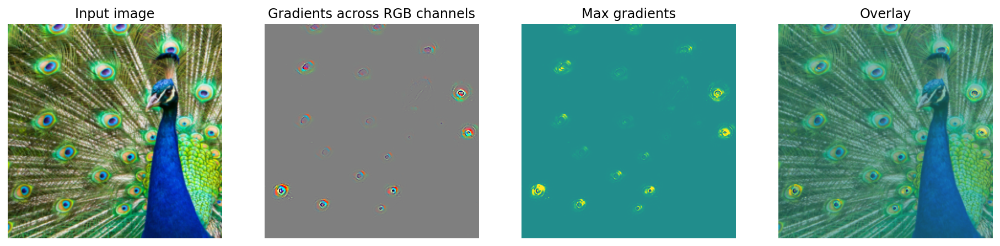

In [8]:
visualize_helper(models.vgg19_bn)

#### ResNet-50

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/checkpoints/resnet50-19c8e357.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

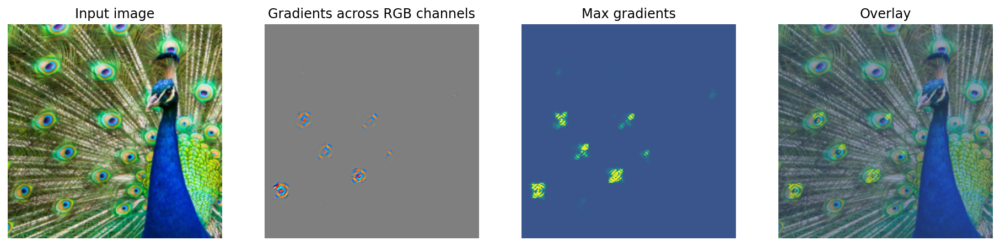

In [9]:
visualize_helper(models.resnet50)

#### ResNet-152

Downloading: "https://download.pytorch.org/models/resnet152-b121ed2d.pth" to /root/.cache/torch/checkpoints/resnet152-b121ed2d.pth


  0%|          | 0.00/230M [00:00<?, ?B/s]

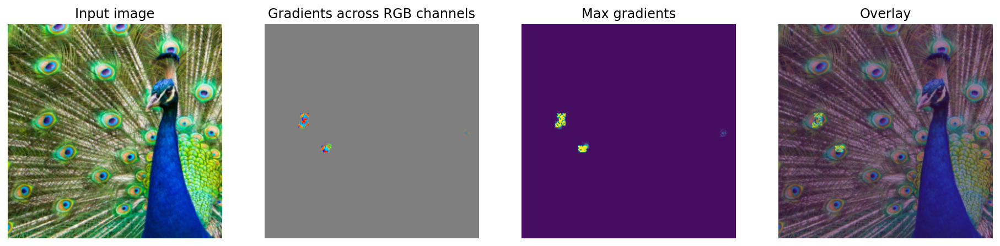

In [10]:
visualize_helper(models.resnet152)

#### SqueezeNet 1.1

Downloading: "https://download.pytorch.org/models/squeezenet1_1-f364aa15.pth" to /root/.cache/torch/checkpoints/squeezenet1_1-f364aa15.pth


  0%|          | 0.00/4.74M [00:00<?, ?B/s]

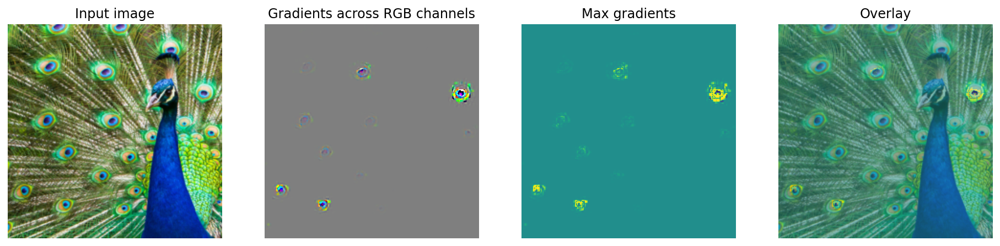

In [11]:
visualize_helper(models.squeezenet1_1)

#### Densenet-121

Downloading: "https://download.pytorch.org/models/densenet121-a639ec97.pth" to /root/.cache/torch/checkpoints/densenet121-a639ec97.pth


  0%|          | 0.00/30.8M [00:00<?, ?B/s]

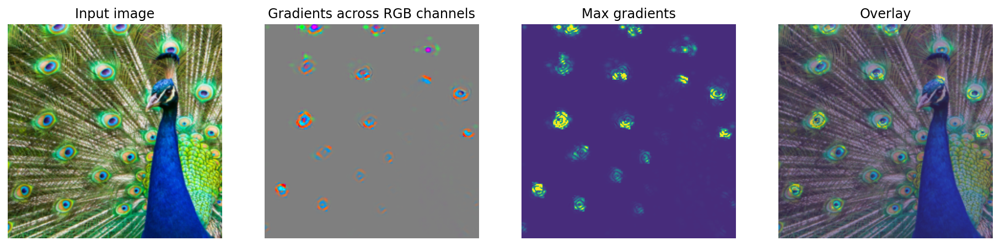

In [12]:
visualize_helper(models.densenet121)

#### Densenet-201

Downloading: "https://download.pytorch.org/models/densenet201-c1103571.pth" to /root/.cache/torch/checkpoints/densenet201-c1103571.pth


  0%|          | 0.00/77.4M [00:00<?, ?B/s]

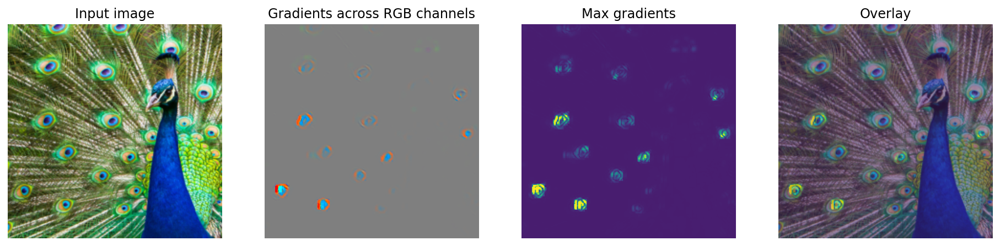

In [13]:
visualize_helper(models.densenet201)

#### Inception v3

Downloading: "https://download.pytorch.org/models/inception_v3_google-1a9a5a14.pth" to /root/.cache/torch/checkpoints/inception_v3_google-1a9a5a14.pth


  0%|          | 0.00/104M [00:00<?, ?B/s]

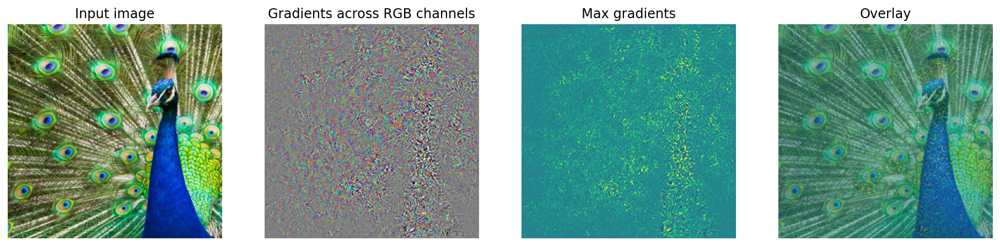

In [14]:
# Image must be 299x299 for Inception models

img_299 = apply_transforms(image, size=299)
visualize_helper(models.inception_v3, img_299)

#### GoogleNet

Downloading: "https://download.pytorch.org/models/googlenet-1378be20.pth" to /root/.cache/torch/checkpoints/googlenet-1378be20.pth


  0%|          | 0.00/49.7M [00:00<?, ?B/s]

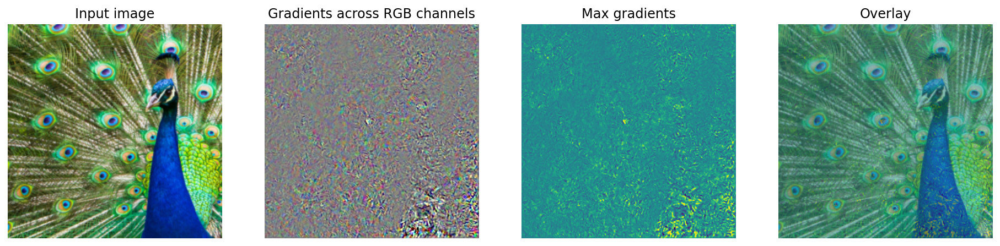

In [15]:
visualize_helper(models.googlenet)

#### ShuffleNet V2

Downloading: "https://download.pytorch.org/models/shufflenetv2_x1-5666bf0f80.pth" to /root/.cache/torch/checkpoints/shufflenetv2_x1-5666bf0f80.pth


  0%|          | 0.00/8.79M [00:00<?, ?B/s]

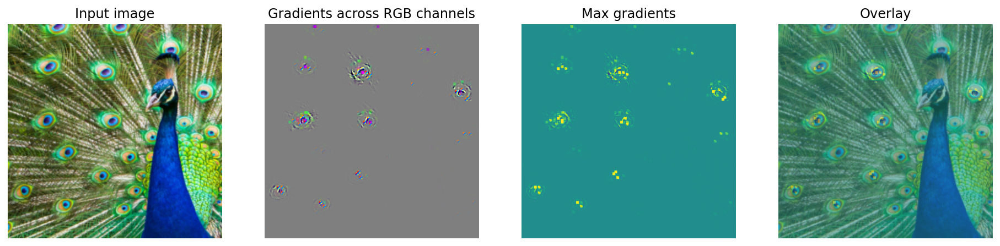

In [16]:
visualize_helper(models.shufflenet_v2_x1_0)

#### MobileNet V2

Downloading: "https://download.pytorch.org/models/mobilenet_v2-b0353104.pth" to /root/.cache/torch/checkpoints/mobilenet_v2-b0353104.pth


  0%|          | 0.00/13.6M [00:00<?, ?B/s]

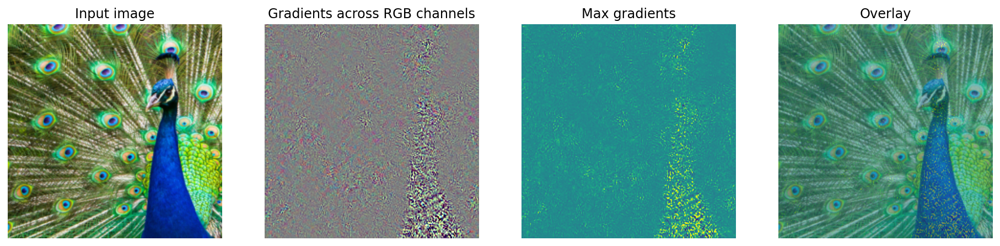

In [17]:
visualize_helper(models.mobilenet_v2)

#### ResNeXt-50-32x4d

Downloading: "https://download.pytorch.org/models/resnext50_32x4d-7cdf4587.pth" to /root/.cache/torch/checkpoints/resnext50_32x4d-7cdf4587.pth


  0%|          | 0.00/95.8M [00:00<?, ?B/s]

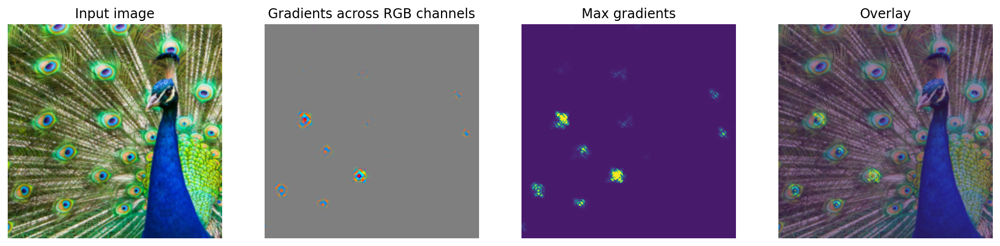

In [18]:
visualize_helper(models.resnext50_32x4d)

#### Wide ResNet-50-2

Downloading: "https://download.pytorch.org/models/wide_resnet50_2-95faca4d.pth" to /root/.cache/torch/checkpoints/wide_resnet50_2-95faca4d.pth


  0%|          | 0.00/132M [00:00<?, ?B/s]

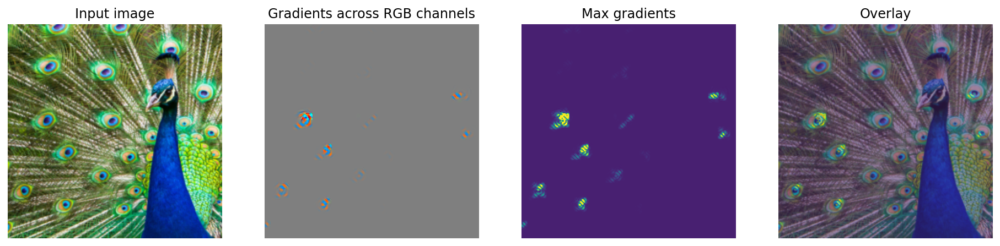

In [19]:
visualize_helper(models.wide_resnet50_2)

#### MNASNet 1.0

Downloading: "https://download.pytorch.org/models/mnasnet1.0_top1_73.512-f206786ef8.pth" to /root/.cache/torch/checkpoints/mnasnet1.0_top1_73.512-f206786ef8.pth


  0%|          | 0.00/16.9M [00:00<?, ?B/s]

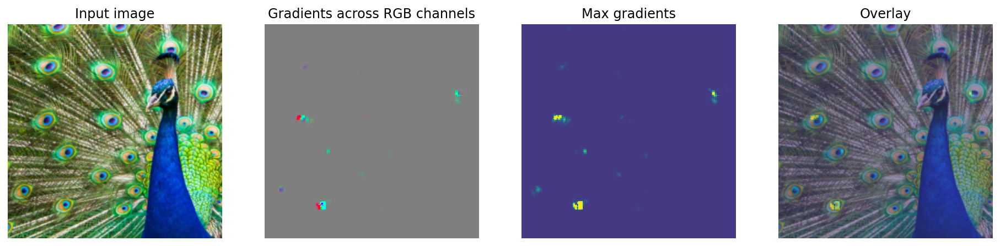

In [20]:
visualize_helper(models.mnasnet1_0)